### Sprint 9 - Machine Learning in Business - Project Introduction
* The mining company, OilyGiant, is interested in determining the best location to put a new well
* An analysis is needed to determine a number of parameters:
    * Determine the best location bassed on oil quality and volume of reserves
    * Build a model to predict the volume of reserves in any new wells
    * Pick oil wells with the highest estimated values in terms of volume
    * Pick a region with the highest total profit for prospective wells
* Ultimately we want the model to to help pick a region with the highest profit margin

In [1]:
import pandas as pd
import numpy as np

import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import StandardScaler

In [2]:
try:
    reg_zero = pd.read_csv('geo_data_0.csv')
except:
    reg_zero = pd.read_csv('/datasets/geo_data_0.csv')

reg_zero

,id,f0,f1,f2,product
0,txEyH,0.705745,-0.497823,1.221170,105.280062
1,2acmU,1.334711,-0.340164,4.365080,73.037750
2,409Wp,1.022732,0.151990,1.419926,85.265647
3,iJLyR,-0.032172,0.139033,2.978566,168.620776
4,Xdl7t,1.988431,0.155413,4.751769,154.036647
...,...,...,...,...,...
99995,DLsed,0.971957,0.370953,6.075346,110.744026
99996,QKivN,1.392429,-0.382606,1.273912,122.346843
99997,3rnvd,1.029585,0.018787,-1.348308,64.375443
99998,7kl59,0.998163,-0.528582,1.583869,74.040764


In [3]:
reg_zero.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB


In [4]:
reg_zero.describe()

,f0,f1,f2,product
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.500419,0.250143,2.502647,92.500000
std,0.871832,0.504433,3.248248,44.288691
min,-1.408605,-0.848218,-12.088328,0.000000
25%,-0.072580,-0.200881,0.287748,56.497507
50%,0.502360,0.250252,2.515969,91.849972
75%,1.073581,0.700646,4.715088,128.564089
max,2.362331,1.343769,16.003790,185.364347


In [5]:
reg_zero.isnull().sum()/len(reg_zero)

id         0.0
f0         0.0
f1         0.0
f2         0.0
product    0.0
dtype: float64

In [6]:
reg_zero['id'].duplicated().sum()

10

In [7]:
# zg1 = zero_geo.drop_duplicates('id', keep='last')

zg2 = reg_zero.sort_values(by='product', ascending=False)
zero_geo = zg2.drop_duplicates(subset='id', keep='first')
zero_geo

,id,f0,f1,f2,product
8826,rjMou,1.797736,0.098212,6.148260,185.364347
99818,7cHIv,0.518445,-0.412790,4.951916,185.362690
94175,uCDzR,0.351428,-0.400244,7.227618,185.355615
1925,IfqrC,0.624430,-0.469312,5.753677,185.354980
45291,5FEPb,1.758787,-0.395038,6.719085,185.352015
...,...,...,...,...,...
55969,EeI1x,-0.792553,0.439711,-0.696314,0.021781
5105,kmJjD,-0.701882,0.570246,2.288005,0.009428
58769,YcHB5,-0.702486,0.523053,-1.224802,0.006114
97721,oZ3UJ,0.701532,0.808797,-2.221334,0.004022


In [9]:
try:
    reg_one = pd.read_csv('geo_data_1.csv')
except:
    reg_one = pd.read_csv('/datasets/geo_data_1.csv')

reg_one

,id,f0,f1,f2,product
0,kBEdx,-15.001348,-8.276000,-0.005876,3.179103
1,62mP7,14.272088,-3.475083,0.999183,26.953261
2,vyE1P,6.263187,-5.948386,5.001160,134.766305
3,KcrkZ,-13.081196,-11.506057,4.999415,137.945408
4,AHL4O,12.702195,-8.147433,5.004363,134.766305
...,...,...,...,...,...
99995,QywKC,9.535637,-6.878139,1.998296,53.906522
99996,ptvty,-10.160631,-12.558096,5.005581,137.945408
99997,09gWa,-7.378891,-3.084104,4.998651,137.945408
99998,rqwUm,0.665714,-6.152593,1.000146,30.132364


In [10]:
reg_one.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB


In [11]:
reg_one.describe()

,f0,f1,f2,product
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.141296,-4.796579,2.494541,68.825000
std,8.965932,5.119872,1.703572,45.944423
min,-31.609576,-26.358598,-0.018144,0.000000
25%,-6.298551,-8.267985,1.000021,26.953261
50%,1.153055,-4.813172,2.011479,57.085625
75%,8.621015,-1.332816,3.999904,107.813044
max,29.421755,18.734063,5.019721,137.945408


In [12]:
reg_one.isnull().sum()/len(reg_one)

id         0.0
f0         0.0
f1         0.0
f2         0.0
product    0.0
dtype: float64

In [13]:
reg_one['id'].duplicated().sum()

4

In [14]:
og = reg_one.sort_values(by='product', ascending=False)
one_geo = og.drop_duplicates(subset='id', keep='first')
one_geo

,id,f0,f1,f2,product
53864,MzRzn,2.901352,-3.475398,5.001393,137.945408
97083,nW6eC,-4.030430,-14.020643,5.009571,137.945408
88340,xwJzQ,-3.373117,-9.227661,4.994369,137.945408
64879,Xd8DC,-5.360281,-2.388204,5.001439,137.945408
7288,Stdrb,-8.058661,-2.244840,5.000753,137.945408
...,...,...,...,...,...
67767,ZO5rv,1.760957,-20.519098,-0.003307,0.000000
36443,dg885,7.541031,0.453559,0.003708,0.000000
36430,1rxbb,10.486395,2.437573,0.000552,0.000000
67776,qtGm8,5.970514,-8.297911,0.002686,0.000000


In [15]:
try:
    reg_two = pd.read_csv('geo_data_2.csv')
except:
    reg_two = pd.read_csv('/datasets/geo_data_2.csv')

reg_two

,id,f0,f1,f2,product
0,fwXo0,-1.146987,0.963328,-0.828965,27.758673
1,WJtFt,0.262778,0.269839,-2.530187,56.069697
2,ovLUW,0.194587,0.289035,-5.586433,62.871910
3,q6cA6,2.236060,-0.553760,0.930038,114.572842
4,WPMUX,-0.515993,1.716266,5.899011,149.600746
...,...,...,...,...,...
99995,4GxBu,-1.777037,1.125220,6.263374,172.327046
99996,YKFjq,-1.261523,-0.894828,2.524545,138.748846
99997,tKPY3,-1.199934,-2.957637,5.219411,157.080080
99998,nmxp2,-2.419896,2.417221,-5.548444,51.795253


In [16]:
reg_two.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB


In [17]:
reg_two.describe()

,f0,f1,f2,product
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.002023,-0.002081,2.495128,95.000000
std,1.732045,1.730417,3.473445,44.749921
min,-8.760004,-7.084020,-11.970335,0.000000
25%,-1.162288,-1.174820,0.130359,59.450441
50%,0.009424,-0.009482,2.484236,94.925613
75%,1.158535,1.163678,4.858794,130.595027
max,7.238262,7.844801,16.739402,190.029838


In [18]:
reg_two.isnull().sum()/len(reg_two)

id         0.0
f0         0.0
f1         0.0
f2         0.0
product    0.0
dtype: float64

In [19]:
reg_two['id'].duplicated().sum()

4

In [20]:
rt = reg_two.sort_values(by='product', ascending=False)
two_geo = rt.drop_duplicates(subset='id', keep='first')
two_geo

,id,f0,f1,f2,product
79705,UAhji,-2.747914,1.555227,3.342182,190.029838
93444,IB0JE,3.026506,1.344623,8.891243,190.013589
35099,2HeCn,2.848844,-1.701996,9.437101,190.011722
21943,dldNH,-2.500091,2.024392,6.291513,190.010982
37870,CpuBi,-0.686667,-3.219452,5.963290,190.010029
...,...,...,...,...,...
39815,Qi2Do,-0.611718,0.951748,1.986600,0.014039
31253,ABIo5,0.028724,0.998376,-0.608745,0.009761
32261,TNDTo,-1.346806,0.819415,-3.498344,0.009204
43452,xMjFy,-0.832947,1.365373,2.766343,0.004606


* Dataframes loaded and observed - no noticeable refining needed as of now
* No blank values in all 3 DFs
* Duplicate IDs removed - the IDs with the largest amount of production were kept

#### Data Training and Testing - refine datasets into features and targets

In [21]:
zero_geo.columns

Index(['id', 'f0', 'f1', 'f2', 'product'], dtype='object')

In [22]:
features_zero = zero_geo[['f0', 'f1', 'f2']]
target_zero = zero_geo['product']

features_one = one_geo[['f0', 'f1', 'f2']]
target_one = one_geo['product']

features_two = two_geo[['f0', 'f1', 'f2']]
target_two = two_geo['product']

#### Split Datasets to use for validation and training

In [23]:
# features_train_zero, features_validation_zero, target_train_zero, target_validation_zero, zero_index_train, zero_index_val = train_test_split(features_zero, target_zero, zero_geo.index, test_size=0.25, random_state=12345)

features_train_zero, features_validation_zero, target_train_zero, target_validation_zero = train_test_split(features_zero, target_zero, test_size=0.25, random_state=12345)


In [24]:
# features_train_one, features_validation_one, target_train_one, target_validation_one, one_index_train, one_index_val = train_test_split(features_one, target_one, one_geo.index, test_size=0.25, random_state=12345)

features_train_one, features_validation_one, target_train_one, target_validation_one = train_test_split(features_one, target_one, test_size=0.25, random_state=12345)

In [25]:
# features_train_two, features_validation_two, target_train_two, target_validation_two, two_index_train, two_index_val = train_test_split(features_two, target_two, two_geo.index, test_size=0.25, random_state=12345)

features_train_two, features_validation_two, target_train_two, target_validation_two = train_test_split(features_two, target_two, test_size=0.25, random_state=12345)

In [26]:
print(features_train_zero.shape)
print(features_validation_zero.shape)
print(target_train_zero.shape)
print(target_validation_zero.shape)
print(features_train_one.shape)
print(features_validation_one.shape)
print(target_train_one.shape)
print(target_validation_one.shape)
print(features_train_two.shape)
print(features_validation_two.shape)
print(target_train_two.shape)
print(target_validation_two.shape)

# print(zero_index_train)
# print(zero_index_val)
# print(one_index_train)
# print(one_index_val)
# print(two_index_train)
# print(two_index_val)

(74992, 3)
(24998, 3)
(74992,)
(24998,)
(74997, 3)
(24999, 3)
(74997,)
(24999,)
(74997, 3)
(24999, 3)
(74997,)
(24999,)


In [27]:
scaler = StandardScaler()
features_train_zero_scaled = scaler.fit_transform(features_train_zero)

model = LinearRegression()
model.fit(features_train_zero_scaled, target_train_zero)
predict_zero = model.predict(features_validation_zero)

# zero_lin_results = pd.DataFrame({'index': zero_index_val, 'zero_pred':predict_zero})

zero_mean = np.mean(predict_zero)
rsme_zero = (mean_squared_error(target_validation_zero, predict_zero))**0.5

print('Predictions (Region Zero) Mean:', zero_mean)
print('RSME Zero: ', rsme_zero)

Predictions (Region Zero) Mean: 146.03753121291498
RSME Zero:  81.35244997875857


In [28]:
scaler = StandardScaler()
features_train_one_scaled = scaler.fit_transform(features_train_one)

model = LinearRegression()
model.fit(features_train_one_scaled, target_train_one)
predict_one = model.predict(features_validation_one)

# one_lin_results = pd.DataFrame({'index': one_index_val, 'one_pred':predict_one})

one_mean = np.mean(predict_one)
rsme_one = (mean_squared_error(target_validation_one, predict_one))**0.5

print('Predictions (Region One) Mean:', one_mean)
print('RSME One: ', rsme_one)

Predictions (Region One) Mean: 182.1069790178086
RSME One:  118.50642418560288


In [29]:
scaler = StandardScaler()
features_train_two_scaled = scaler.fit_transform(features_train_two)

model = LinearRegression()
model.fit(features_train_two_scaled, target_train_two)
predict_two = model.predict(features_validation_two)

# two_lin_results = pd.DataFrame({'index': two_index_val, 'two_pred':predict_two})

two_mean = np.mean(predict_two)
rsme_two = (mean_squared_error(target_validation_two, predict_two))**0.5

print('Predictions (Region Two) Mean:', two_mean)
print('RSME Two: ', rsme_two)

Predictions (Region Two) Mean: 144.80489752936137
RSME Two:  81.15982969262923


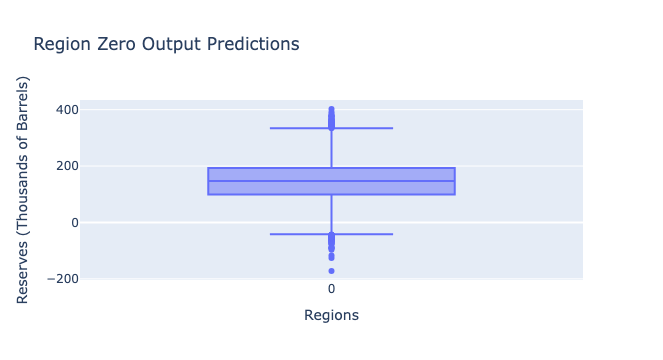

In [30]:
# region_reg = pd.DataFrame({
#     'Volume': np.concatenate([predict_zero, predict_one, predict_two]),
#     'Region': ['region zero'] * len(predict_zero) + ['region one'] * len(predict_one) + ['region two'] * len(predict_two)
# })

# region_reg.groupby('Region')['Volume']

# region_reg

px.box(predict_zero, title = 'Region Zero Output Predictions').update_layout(xaxis_title="Regions", yaxis_title='Reserves (Thousands of Barrels)')



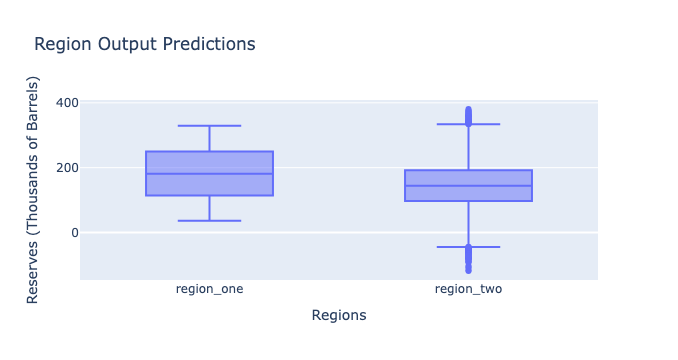

In [31]:
px.box(pd.DataFrame(data={'region_one':predict_one, 'region_two':predict_two}),
       title = 'Region Output Predictions').update_layout(xaxis_title="Regions", yaxis_title='Reserves (Thousands of Barrels)')

#### Post Prediction Analysis
* Regions One had the highest mean prediction values of output at 182.1069 barrels
* Region Zero and Two had lower RSME Scores
* RSME scores are of concern after scaling because they are very high (over 80 for all 3 datasets)

#### Profit Calculation Preparation
* Store all key values for calculations in separate variables.

* Calculate the volume of reserves sufficient for developing a new well without losses. 

* Compare the obtained value with the average volume of reserves in each region.

* Provide the findings about the preparation for profit calculation step.

In [32]:
budget = 100000000
wells = 200
revenue_per_well = 4500

In [33]:
# Cost of One Well

one_well = budget/wells
print('The cost to produce one well is: ', one_well)

The cost to produce one well is:  500000.0


In [34]:
# Break even cost

break_even = one_well/revenue_per_well

print('The break even point (in oil reserves) is: ', break_even)

The break even point (in oil reserves) is:  111.11111111111111


In [35]:
bar_chart_data = [zero_mean, one_mean, two_mean]

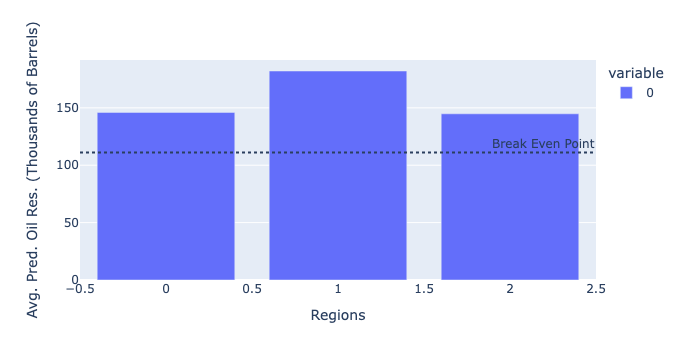

In [36]:
fig = px.bar(bar_chart_data).update_layout(xaxis_title="Regions", yaxis_title='Avg. Pred. Oil Res. (Thousands of Barrels)')
fig.add_hline(y=111.11111, line_dash='dot', annotation_text="Break Even Point")
              # , 
             #  label=dict(
             #      text='Break Even Point',
             #      textposition='end',
             #      font=dict(size=12, color='red'),
             #      yanchor='top')
             # )
fig.show()

#### Profit Calculation
* Function to suammarize the target volume of reserves for wells with the highest values of predictions
* Need to determine a specific regino for oil well development with function put

 4.1. Pick the wells with the highest values of predictions. 

 4.2. Summarize the target volume of reserves in accordance with these predictions

 4.3. Provide findings: suggest a region for oil wells' development and justify the choice. Calculate the profit for the obtained volume of reserves.

In [37]:
zero_sort = pd.Series(predict_zero).reset_index(drop=True).sort_values(ascending=False).head(200)
zero_vals = target_validation_zero.reset_index(drop=True)[zero_sort.index]

In [38]:
one_sort = pd.Series(predict_one).reset_index(drop=True).sort_values(ascending=False).head(200)
one_vals = target_validation_one.reset_index(drop=True)[one_sort.index]

In [39]:
two_sort = pd.Series(predict_two).reset_index(drop=True).sort_values(ascending=False).head(200)
two_vals = target_validation_two.reset_index(drop=True)[two_sort.index]


In [40]:
def profit_calc(targets, predictions):
    predictions_sorted = pd.Series(predictions).reset_index(drop=True).sort_values(ascending=False).head(200)
    reserves = targets.reset_index(drop=True)[predictions_sorted.index]
    total_reserves = reserves.sum()
    return (total_reserves * revenue_per_well) - budget

In [41]:
print('Profit of Region Zero: ', profit_calc(target_validation_zero, predict_zero))
print('Profit of Region One: ', profit_calc(target_validation_one, predict_one))
print('Profit of Region Two: ', profit_calc(target_validation_two, predict_two))

Profit of Region Zero:  28905575.828539208
Profit of Region One:  24150866.966815114
Profit of Region Two:  21719950.083379447


#### Profit Conclusions
* Based on the calculation above, Region Zero would likely lead to the best possibility of higher profits

#### Bootstrapping
* Using bootstrapping (with 1000 samples), we can determine the distribution of profit
* Average profit at a 95% confidence interval and risk of losses will be calculated 

In [43]:
def profit_distribution(targets, predictions):
    state = np.random.RandomState(4)
    profits = []
    targets = pd.Series(targets).reset_index(drop=True)
    predictions = pd.Series(predictions).reset_index(drop=True)
    for i in range(1000):
        sample_targets = targets.sample(500, replace=True, random_state=state)
        predictions_sampled = predictions[sample_targets.index]
        profit = profit_calc(sample_targets, predictions_sampled)
        profits.append(profit)
    return np.array(profits)


In [44]:
zero_boot = profit_distribution(target_validation_zero, predict_zero)
one_boot = profit_distribution(target_validation_one, predict_one)
two_boot = profit_distribution(target_validation_two, predict_two)

In [45]:
print("Mean predicted profits of region zero: ", zero_boot.mean())
print("Mean predicted profits of region one: ", one_boot.mean())
print("Mean predicted profits of region two: ", two_boot.mean())

Mean predicted profits of region zero:  3124456.27267698
Mean predicted profits of region one:  3932845.41141109
Mean predicted profits of region two:  3129057.2784272456


#### Confidence Interval

In [47]:
confidence_interval_zero = np.percentile(zero_boot, [2.5, 97.5])
print('Confidence Interval of Region Zero: ', confidence_interval_zero)

confidence_interval_one = np.percentile(one_boot, [2.5, 97.5])
print('Confidence Interval of Region One: ', confidence_interval_one)

confidence_interval_two = np.percentile(two_boot, [2.5, 97.5])
print('Confidence Interval of Region Two: ', confidence_interval_two)

Confidence Interval of Region Zero:  [-1651274.14875194  8010880.03901623]
Confidence Interval of Region One:  [ -53140.70622981 7860637.36515713]
Confidence Interval of Region Two:  [-2505854.89614522  8345643.0354841 ]


In [48]:
risk_zero = (zero_boot < 0).mean() * 100
print('Region Zero estimated losses: ', risk_zero)

risk_one = (one_boot < 0).mean() * 100
print('Region One estimated losses: ', risk_one)

risk_two = (two_boot < 0).mean() * 100
print('Region Two estimated losses: ', risk_two)

Region Zero estimated losses:  11.700000000000001
Region One estimated losses:  2.7
Region Two estimated losses:  11.799999999999999


#### Conclusion
* Based on the findings above, Region One is likely the best place to develop new wells
* The 95% confidence interval had a range of -53140.70622981 7860637.36515713 in profit
    * The estimated losses were around 2.7%
* Although Regions Zero and Two had higher yields for confidence intervals, they had almost 3x-5x larger minimums while also yielding higher estimated losses of at least 11.7%